In [0]:
%pip install networkx
%pip install --upgrade scipy

Python interpreter will be restarted.
Requirement already satisfied: networkx in /local_disk0/.ephemeral_nfs/envs/pythonEnv-e525cbb6-0e1b-4481-b8b7-b2a4c72e0163/lib/python3.8/site-packages (3.1)
Python interpreter will be restarted.
Python interpreter will be restarted.
Requirement already satisfied: scipy in /local_disk0/.ephemeral_nfs/envs/pythonEnv-e525cbb6-0e1b-4481-b8b7-b2a4c72e0163/lib/python3.8/site-packages (1.10.1)
Requirement already satisfied: numpy<1.27.0,>=1.19.5 in /databricks/python3/lib/python3.8/site-packages (from scipy) (1.20.1)
Python interpreter will be restarted.

In [0]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import pyspark.sql.functions as F

In [0]:
mcl = spark.sql("SELECT * FROM databricks_tourism_workspace.default.gowalla_mcl")

In [0]:
display(mcl)

cluster_id,nodes_in_cluster
4192,"List(2, List(1241, 7, 7159, 3175, 8363, 6, 8328, 1744, 3257, 3285, 3169, 8426, 8408, 8, 8258, 2, 8327, 3085, 6307, 685, 1763, 6906, 8326))"
4193,"List(3, List(1, 3, 12, 4, 18, 15))"
4194,"List(4, List(29, 541, 558, 1360, 54, 228, 7142, 32, 221, 17, 209, 207, 1, 96, 214, 85, 142, 481, 6981, 3, 37, 12, 11, 154, 525, 4589, 5032, 4, 36, 18, 140, 14, 583, 1298, 3213, 620, 15, 38, 42, 86, 40, 16, 91, 152))"
4195,"List(8, List(7, 34, 2710, 43, 6, 9, 27, 56, 41, 28, 33, 10, 105, 8, 2693, 2, 102, 92, 305, 21, 30, 23, 20))"
4196,"List(11, List(54, 6189, 7478, 4636, 5142, 1728, 1240, 6881, 32, 25, 6918, 7466, 143, 2795, 221, 6216, 6725, 17, 209, 139, 208, 6411, 1, 7359, 96, 214, 419, 6795, 6544, 7062, 142, 481, 210, 6908, 3, 7140, 37, 6025, 12, 141, 6232, 11, 750, 1727, 154, 1234, 4589, 7247, 4, 36, 4043, 6850, 18, 140, 7317, 14, 791, 5233, 1298, 15, 81, 42, 4644, 4205, 40, 16, 2246, 211, 29))"
4197,"List(12, List(541, 1690, 54, 9330, 1728, 32, 25, 3963, 17, 646, 96, 3567, 9457, 142, 9407, 9317, 5893, 3, 37, 12, 141, 9268, 11, 4813, 4589, 426, 4, 18, 140, 14, 15, 81, 42, 9463, 16, 29))"
4198,"List(13, List(13))"
4199,"List(35, List(25, 37, 35, 16, 29))"
4200,"List(36, List(541, 32, 39, 142, 3, 11, 36, 38, 42, 16))"
4201,"List(37, List(1690, 54, 5142, 1508, 32, 8234, 3372, 39, 8251, 2759, 7466, 8232, 215, 221, 6216, 8001, 9452, 4217, 17, 96, 214, 9035, 9350, 9462, 142, 7652, 210, 6108, 4052, 6160, 5914, 5893, 37, 6025, 9268, 35, 6037, 4589, 4, 18, 140, 14, 9481, 4587, 9031, 223, 38, 42, 217, 8491, 40, 16, 8597, 9212, 29))"


In [0]:
graph_edges = spark.sql("SELECT * FROM databricks_tourism_workspace.default.graph_edges").select("src", "dst", F.col("normal").alias("weight"))

In [0]:
mcl_graph = mcl.select("nodes_in_cluster.src", F.explode("nodes_in_cluster.clusters").alias("dst"), "cluster_id")

In [0]:
mcl_graph = mcl_graph.select("src", "dst")

In [0]:
mcl_graph = mcl_graph.join(graph_edges, on=((mcl_graph.src == graph_edges.src) & (mcl_graph.dst == graph_edges.dst))).select(mcl_graph.src, mcl_graph.dst, graph_edges.weight)

In [0]:
mcl_graph.write.format("delta").mode("overwrite").option("overwriteSchema", "true").saveAsTable("mcl_graph")

In [0]:
display(mcl_graph)

src,dst,weight
1,4,3
2,6,1
2,8,2
2,7,1
3,4,3
4,14,1
4,17,2
4,29,1
4,96,2
4,5032,1


In [0]:
display(mcl_graph.orderBy("weight"))

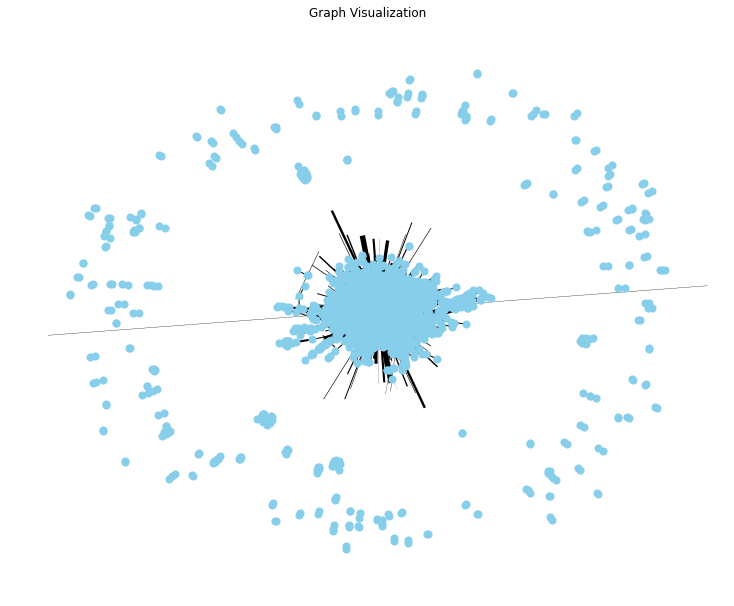

In [0]:
mcl_df = mcl_graph.toPandas()

G = nx.from_pandas_edgelist(mcl_df, 'src', 'dst', ['weight'])

weights = [data['weight'] for _, _, data in G.edges(data=True)]

plt.figure(figsize=(10, 8))
nx.draw(G, with_labels=False, node_color='skyblue', node_size=50, edge_color='black', width= 5*weights, font_size=15)
plt.title("Graph Visualization")
plt.show()